# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [5]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Test Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [6]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

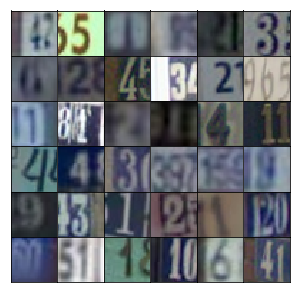

In [7]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [8]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [9]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), self.scaler(y)

## Network Inputs

Here, just creating some placeholders like normal.

In [10]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [62]:
def leaky_relu(tensor, alpha=0.3):
    return tf.maximum(alpha * tensor, tensor)
    
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer. Reshape, Batch normalization,Leakly ReLU => 4x4x512
        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = leaky_relu(tf.layers.batch_normalization(x1, training=training), alpha)
        
        # Conv1, BN, LeReLU =>  8x8x256 
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding="SAME")
        x2 = leaky_relu(tf.layers.batch_normalization(x2, training=training), alpha)

        # Conv2, BN, LeReLU => 16x16x128
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding="SAME")
        x3 = leaky_relu(tf.layers.batch_normalization(x3, training=training), alpha)
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding="SAME")
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [63]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x32
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [64]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Again, nothing new here.

In [65]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [66]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, 0.5)

Here is a function for displaying generated images.

In [67]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img)
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network.

In [68]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5), restore=False):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(50, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        
        # Restore variables from disk or initialize variables
        if restore: 
            saver.restore(sess, './checkpoints/generator.ckpt')
        else: 
            sess.run(tf.global_variables_initializer())
            
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 5, 10, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [72]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 10
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/10... Discriminator Loss: 1.9591... Generator Loss: 0.3356
Epoch 1/10... Discriminator Loss: 0.4110... Generator Loss: 1.7265
Epoch 1/10... Discriminator Loss: 0.1221... Generator Loss: 2.9370
Epoch 1/10... Discriminator Loss: 0.1774... Generator Loss: 2.4457
Epoch 1/10... Discriminator Loss: 0.2779... Generator Loss: 2.0975
Epoch 1/10... Discriminator Loss: 0.1307... Generator Loss: 3.0636
Epoch 1/10... Discriminator Loss: 0.3928... Generator Loss: 1.9517
Epoch 1/10... Discriminator Loss: 0.1229... Generator Loss: 3.4657
Epoch 1/10... Discriminator Loss: 0.2611... Generator Loss: 2.3353
Epoch 1/10... Discriminator Loss: 0.3203... Generator Loss: 3.0813


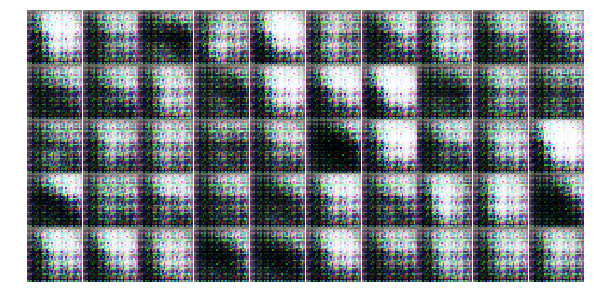

Epoch 1/10... Discriminator Loss: 0.3733... Generator Loss: 2.2348
Epoch 1/10... Discriminator Loss: 0.9575... Generator Loss: 0.9539
Epoch 1/10... Discriminator Loss: 0.6095... Generator Loss: 1.4978
Epoch 1/10... Discriminator Loss: 0.4939... Generator Loss: 2.1036
Epoch 1/10... Discriminator Loss: 1.0292... Generator Loss: 0.7446
Epoch 1/10... Discriminator Loss: 0.5309... Generator Loss: 1.5986
Epoch 1/10... Discriminator Loss: 0.5399... Generator Loss: 2.1822
Epoch 1/10... Discriminator Loss: 2.2621... Generator Loss: 5.0637
Epoch 1/10... Discriminator Loss: 0.6612... Generator Loss: 1.4754
Epoch 1/10... Discriminator Loss: 0.5803... Generator Loss: 1.8279


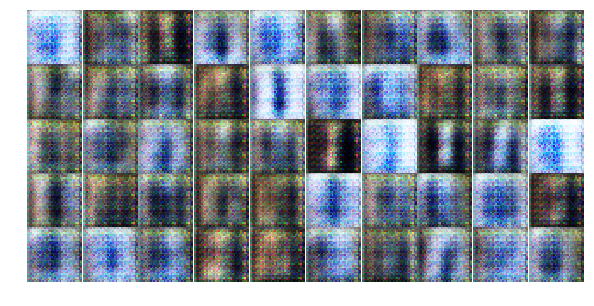

Epoch 1/10... Discriminator Loss: 1.0700... Generator Loss: 0.6263
Epoch 1/10... Discriminator Loss: 0.9597... Generator Loss: 0.7531
Epoch 1/10... Discriminator Loss: 0.5588... Generator Loss: 1.7546
Epoch 1/10... Discriminator Loss: 0.2551... Generator Loss: 2.3367
Epoch 1/10... Discriminator Loss: 0.5590... Generator Loss: 2.3072
Epoch 1/10... Discriminator Loss: 0.3475... Generator Loss: 2.9773
Epoch 1/10... Discriminator Loss: 1.6497... Generator Loss: 0.5712
Epoch 1/10... Discriminator Loss: 0.9616... Generator Loss: 1.1541
Epoch 1/10... Discriminator Loss: 1.0835... Generator Loss: 0.9759
Epoch 1/10... Discriminator Loss: 1.1190... Generator Loss: 1.6070


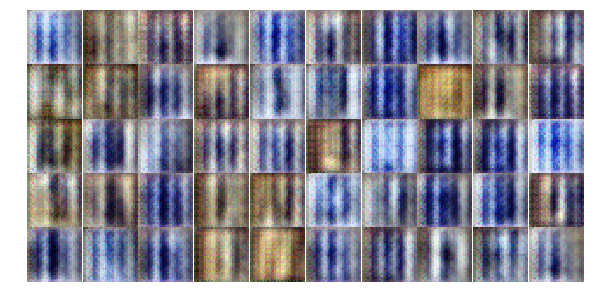

Epoch 1/10... Discriminator Loss: 1.0860... Generator Loss: 1.2333
Epoch 1/10... Discriminator Loss: 0.6215... Generator Loss: 1.4219
Epoch 1/10... Discriminator Loss: 0.6761... Generator Loss: 1.7216
Epoch 1/10... Discriminator Loss: 0.8723... Generator Loss: 1.2130
Epoch 1/10... Discriminator Loss: 0.6882... Generator Loss: 1.4686
Epoch 1/10... Discriminator Loss: 0.4374... Generator Loss: 1.5575
Epoch 1/10... Discriminator Loss: 0.8025... Generator Loss: 2.4952
Epoch 1/10... Discriminator Loss: 0.9019... Generator Loss: 2.4390
Epoch 1/10... Discriminator Loss: 0.5557... Generator Loss: 2.0185
Epoch 1/10... Discriminator Loss: 0.6550... Generator Loss: 1.5747


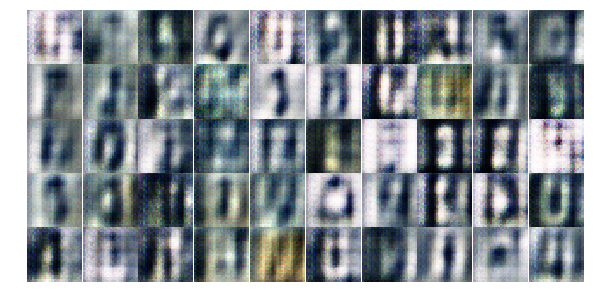

Epoch 1/10... Discriminator Loss: 0.4565... Generator Loss: 1.6891
Epoch 1/10... Discriminator Loss: 0.5235... Generator Loss: 1.6408
Epoch 1/10... Discriminator Loss: 1.0787... Generator Loss: 0.9229
Epoch 1/10... Discriminator Loss: 0.6973... Generator Loss: 1.7305
Epoch 1/10... Discriminator Loss: 0.7991... Generator Loss: 1.5569
Epoch 1/10... Discriminator Loss: 0.8727... Generator Loss: 2.0471
Epoch 1/10... Discriminator Loss: 0.6383... Generator Loss: 1.3715
Epoch 1/10... Discriminator Loss: 0.9376... Generator Loss: 1.0697
Epoch 1/10... Discriminator Loss: 0.8142... Generator Loss: 1.3004
Epoch 1/10... Discriminator Loss: 0.7466... Generator Loss: 1.1243


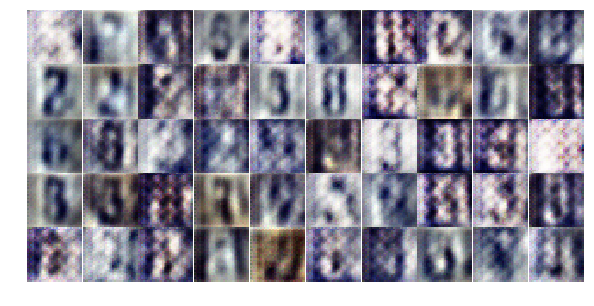

Epoch 1/10... Discriminator Loss: 0.6908... Generator Loss: 1.6258
Epoch 1/10... Discriminator Loss: 0.5234... Generator Loss: 1.5440
Epoch 1/10... Discriminator Loss: 0.8706... Generator Loss: 1.2678
Epoch 1/10... Discriminator Loss: 0.4997... Generator Loss: 1.5995
Epoch 1/10... Discriminator Loss: 0.4817... Generator Loss: 1.7837
Epoch 1/10... Discriminator Loss: 0.8606... Generator Loss: 0.9047
Epoch 1/10... Discriminator Loss: 0.8440... Generator Loss: 1.9508
Epoch 2/10... Discriminator Loss: 0.7099... Generator Loss: 1.8174
Epoch 2/10... Discriminator Loss: 0.7211... Generator Loss: 1.3631
Epoch 2/10... Discriminator Loss: 0.7072... Generator Loss: 1.2924


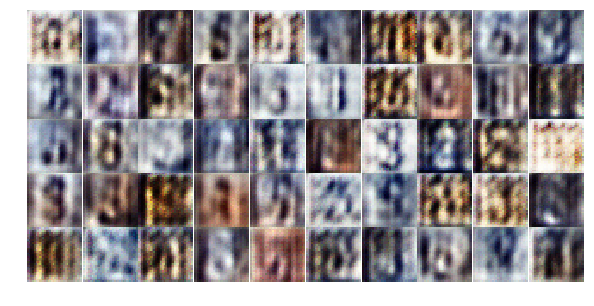

Epoch 2/10... Discriminator Loss: 0.7433... Generator Loss: 1.7289
Epoch 2/10... Discriminator Loss: 0.8737... Generator Loss: 1.4348
Epoch 2/10... Discriminator Loss: 0.9026... Generator Loss: 1.0914
Epoch 2/10... Discriminator Loss: 0.9380... Generator Loss: 1.3394
Epoch 2/10... Discriminator Loss: 0.9544... Generator Loss: 1.3164
Epoch 2/10... Discriminator Loss: 1.1441... Generator Loss: 2.2127
Epoch 2/10... Discriminator Loss: 0.9597... Generator Loss: 1.6763
Epoch 2/10... Discriminator Loss: 1.1840... Generator Loss: 0.8433
Epoch 2/10... Discriminator Loss: 1.0182... Generator Loss: 1.0811
Epoch 2/10... Discriminator Loss: 0.9286... Generator Loss: 1.1722


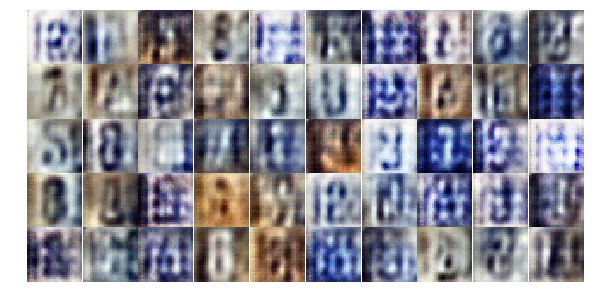

Epoch 2/10... Discriminator Loss: 0.7595... Generator Loss: 1.2198
Epoch 2/10... Discriminator Loss: 0.8935... Generator Loss: 1.1931
Epoch 2/10... Discriminator Loss: 0.9429... Generator Loss: 2.2675
Epoch 2/10... Discriminator Loss: 0.6553... Generator Loss: 1.2803
Epoch 2/10... Discriminator Loss: 1.1964... Generator Loss: 1.1019
Epoch 2/10... Discriminator Loss: 0.9825... Generator Loss: 1.8076
Epoch 2/10... Discriminator Loss: 1.3107... Generator Loss: 1.1798
Epoch 2/10... Discriminator Loss: 1.0964... Generator Loss: 0.6862
Epoch 2/10... Discriminator Loss: 1.1944... Generator Loss: 0.9034
Epoch 2/10... Discriminator Loss: 1.4793... Generator Loss: 0.3743


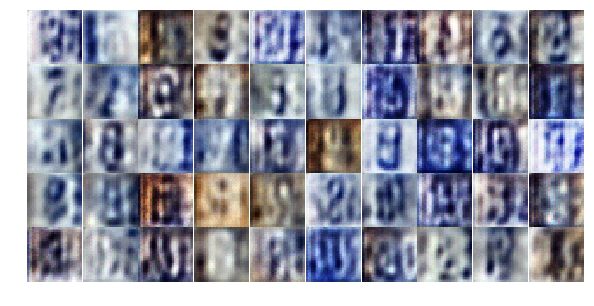

Epoch 2/10... Discriminator Loss: 1.0844... Generator Loss: 0.7764
Epoch 2/10... Discriminator Loss: 1.3768... Generator Loss: 0.7855
Epoch 2/10... Discriminator Loss: 1.0290... Generator Loss: 1.2523
Epoch 2/10... Discriminator Loss: 0.8781... Generator Loss: 1.4688
Epoch 2/10... Discriminator Loss: 0.8116... Generator Loss: 1.2665
Epoch 2/10... Discriminator Loss: 1.2496... Generator Loss: 1.0386
Epoch 2/10... Discriminator Loss: 0.8230... Generator Loss: 0.9462
Epoch 2/10... Discriminator Loss: 1.0073... Generator Loss: 0.8801
Epoch 2/10... Discriminator Loss: 1.3244... Generator Loss: 0.8198
Epoch 2/10... Discriminator Loss: 0.7889... Generator Loss: 1.3987


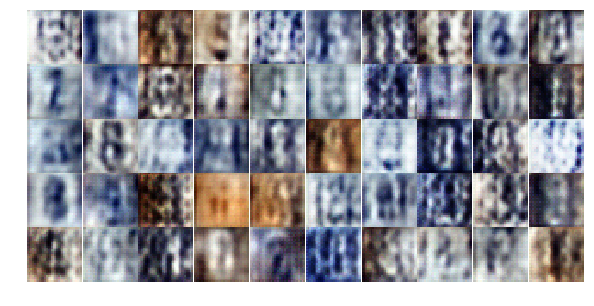

Epoch 2/10... Discriminator Loss: 0.9456... Generator Loss: 0.9822
Epoch 2/10... Discriminator Loss: 1.1362... Generator Loss: 1.0112
Epoch 2/10... Discriminator Loss: 1.0651... Generator Loss: 1.2953
Epoch 2/10... Discriminator Loss: 1.4859... Generator Loss: 0.6355
Epoch 2/10... Discriminator Loss: 0.8222... Generator Loss: 1.2668
Epoch 2/10... Discriminator Loss: 1.3197... Generator Loss: 0.8606
Epoch 2/10... Discriminator Loss: 1.5746... Generator Loss: 0.7286
Epoch 2/10... Discriminator Loss: 1.5495... Generator Loss: 0.7688
Epoch 2/10... Discriminator Loss: 1.2471... Generator Loss: 1.1196
Epoch 2/10... Discriminator Loss: 1.0917... Generator Loss: 1.2603


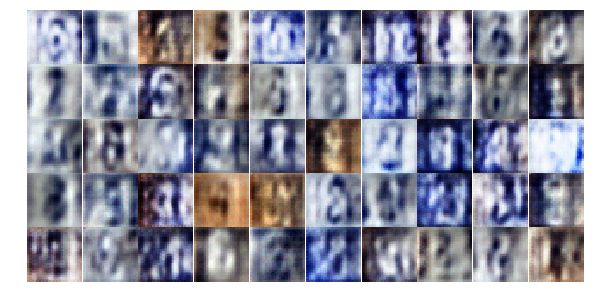

Epoch 2/10... Discriminator Loss: 1.2673... Generator Loss: 0.8752
Epoch 2/10... Discriminator Loss: 1.3005... Generator Loss: 0.9763
Epoch 2/10... Discriminator Loss: 1.1660... Generator Loss: 1.3885
Epoch 2/10... Discriminator Loss: 1.3892... Generator Loss: 0.7334
Epoch 2/10... Discriminator Loss: 1.2495... Generator Loss: 0.7984
Epoch 2/10... Discriminator Loss: 1.2447... Generator Loss: 1.0059
Epoch 2/10... Discriminator Loss: 0.9951... Generator Loss: 1.1859
Epoch 2/10... Discriminator Loss: 0.8756... Generator Loss: 1.2187
Epoch 2/10... Discriminator Loss: 1.0885... Generator Loss: 0.7993
Epoch 2/10... Discriminator Loss: 1.0524... Generator Loss: 1.0950


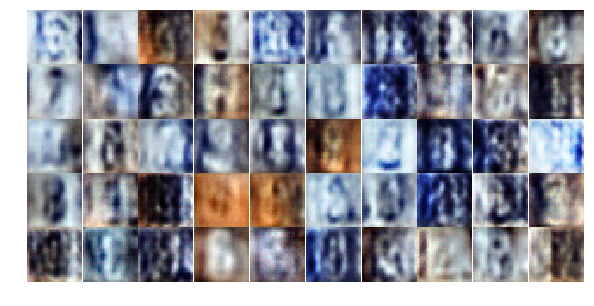

Epoch 2/10... Discriminator Loss: 1.2676... Generator Loss: 1.0609
Epoch 2/10... Discriminator Loss: 0.9693... Generator Loss: 1.1243
Epoch 2/10... Discriminator Loss: 1.2911... Generator Loss: 0.6607
Epoch 2/10... Discriminator Loss: 0.9374... Generator Loss: 1.1615
Epoch 3/10... Discriminator Loss: 1.0800... Generator Loss: 1.5570
Epoch 3/10... Discriminator Loss: 1.2082... Generator Loss: 1.0264
Epoch 3/10... Discriminator Loss: 0.8054... Generator Loss: 1.1650
Epoch 3/10... Discriminator Loss: 1.1588... Generator Loss: 0.7790
Epoch 3/10... Discriminator Loss: 0.8321... Generator Loss: 1.2328
Epoch 3/10... Discriminator Loss: 1.1920... Generator Loss: 0.7195


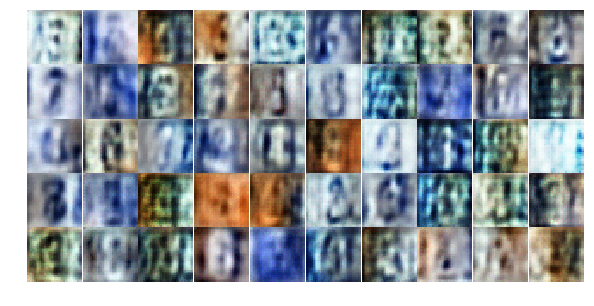

Epoch 3/10... Discriminator Loss: 0.9421... Generator Loss: 1.0856
Epoch 3/10... Discriminator Loss: 0.8838... Generator Loss: 1.0167
Epoch 3/10... Discriminator Loss: 1.0103... Generator Loss: 0.9033
Epoch 3/10... Discriminator Loss: 1.2138... Generator Loss: 1.2075
Epoch 3/10... Discriminator Loss: 0.8327... Generator Loss: 1.1874
Epoch 3/10... Discriminator Loss: 1.1235... Generator Loss: 0.6861
Epoch 3/10... Discriminator Loss: 0.9866... Generator Loss: 0.9955
Epoch 3/10... Discriminator Loss: 0.9893... Generator Loss: 0.8258
Epoch 3/10... Discriminator Loss: 0.8444... Generator Loss: 0.9317
Epoch 3/10... Discriminator Loss: 0.8720... Generator Loss: 0.8155


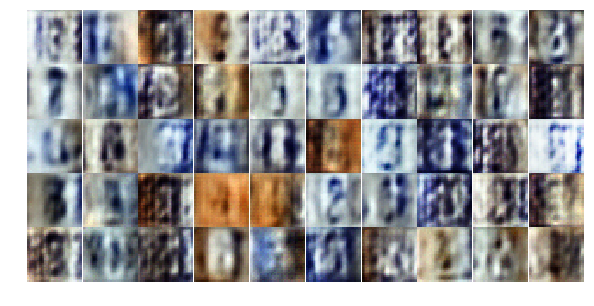

Epoch 3/10... Discriminator Loss: 1.0140... Generator Loss: 1.2529
Epoch 3/10... Discriminator Loss: 0.7400... Generator Loss: 1.5230
Epoch 3/10... Discriminator Loss: 0.7974... Generator Loss: 0.9873
Epoch 3/10... Discriminator Loss: 0.6706... Generator Loss: 1.2283
Epoch 3/10... Discriminator Loss: 0.8052... Generator Loss: 0.9989
Epoch 3/10... Discriminator Loss: 0.6153... Generator Loss: 1.4853
Epoch 3/10... Discriminator Loss: 0.8308... Generator Loss: 0.7133
Epoch 3/10... Discriminator Loss: 0.8383... Generator Loss: 1.6089
Epoch 3/10... Discriminator Loss: 0.7498... Generator Loss: 1.3388
Epoch 3/10... Discriminator Loss: 1.1100... Generator Loss: 0.6758


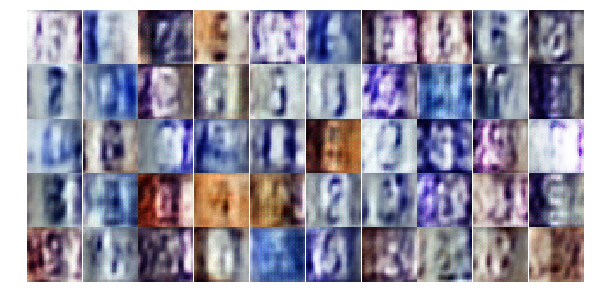

Epoch 3/10... Discriminator Loss: 0.6680... Generator Loss: 1.7034
Epoch 3/10... Discriminator Loss: 0.6024... Generator Loss: 1.5198
Epoch 3/10... Discriminator Loss: 0.8532... Generator Loss: 0.9249
Epoch 3/10... Discriminator Loss: 0.6041... Generator Loss: 1.7551
Epoch 3/10... Discriminator Loss: 0.8438... Generator Loss: 0.9314
Epoch 3/10... Discriminator Loss: 0.5903... Generator Loss: 1.3582
Epoch 3/10... Discriminator Loss: 0.7507... Generator Loss: 0.9747
Epoch 3/10... Discriminator Loss: 0.5353... Generator Loss: 1.3613
Epoch 3/10... Discriminator Loss: 0.5159... Generator Loss: 1.7120
Epoch 3/10... Discriminator Loss: 0.7402... Generator Loss: 1.3090


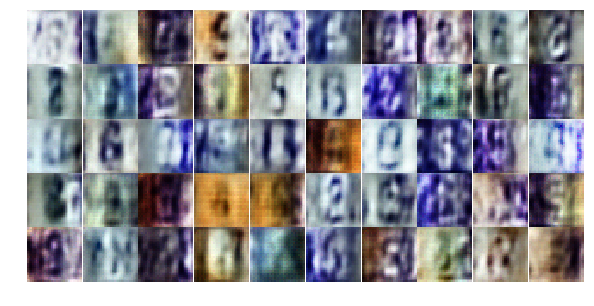

Epoch 3/10... Discriminator Loss: 0.9664... Generator Loss: 1.0907
Epoch 3/10... Discriminator Loss: 0.5474... Generator Loss: 2.1929
Epoch 3/10... Discriminator Loss: 0.6415... Generator Loss: 1.3959
Epoch 3/10... Discriminator Loss: 0.5079... Generator Loss: 1.4481
Epoch 3/10... Discriminator Loss: 0.5063... Generator Loss: 2.0868
Epoch 3/10... Discriminator Loss: 0.7330... Generator Loss: 2.7907
Epoch 3/10... Discriminator Loss: 0.9147... Generator Loss: 0.9704
Epoch 3/10... Discriminator Loss: 0.4620... Generator Loss: 1.7849
Epoch 3/10... Discriminator Loss: 0.5783... Generator Loss: 1.3110
Epoch 3/10... Discriminator Loss: 0.4582... Generator Loss: 1.8147


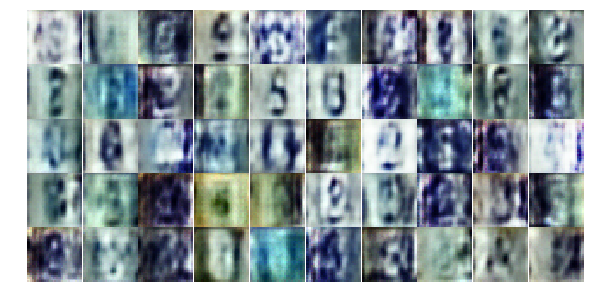

Epoch 3/10... Discriminator Loss: 1.8180... Generator Loss: 0.6707
Epoch 3/10... Discriminator Loss: 1.4616... Generator Loss: 0.5140
Epoch 3/10... Discriminator Loss: 1.0648... Generator Loss: 0.6601
Epoch 3/10... Discriminator Loss: 0.5274... Generator Loss: 1.5580
Epoch 3/10... Discriminator Loss: 1.1617... Generator Loss: 3.8353
Epoch 3/10... Discriminator Loss: 0.5819... Generator Loss: 1.5184
Epoch 3/10... Discriminator Loss: 0.6061... Generator Loss: 2.2048
Epoch 3/10... Discriminator Loss: 0.4718... Generator Loss: 1.6998
Epoch 3/10... Discriminator Loss: 0.6231... Generator Loss: 1.1317
Epoch 3/10... Discriminator Loss: 0.4789... Generator Loss: 1.5605


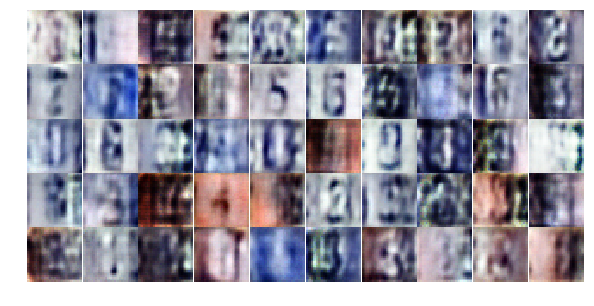

Epoch 3/10... Discriminator Loss: 0.9774... Generator Loss: 1.4133
Epoch 4/10... Discriminator Loss: 0.6857... Generator Loss: 1.3348
Epoch 4/10... Discriminator Loss: 0.7712... Generator Loss: 1.4016
Epoch 4/10... Discriminator Loss: 0.6899... Generator Loss: 1.0745
Epoch 4/10... Discriminator Loss: 0.6383... Generator Loss: 1.4195
Epoch 4/10... Discriminator Loss: 0.3976... Generator Loss: 2.1964
Epoch 4/10... Discriminator Loss: 0.7069... Generator Loss: 3.2204
Epoch 4/10... Discriminator Loss: 0.5868... Generator Loss: 1.8678
Epoch 4/10... Discriminator Loss: 0.5329... Generator Loss: 1.3301
Epoch 4/10... Discriminator Loss: 0.6796... Generator Loss: 2.4820


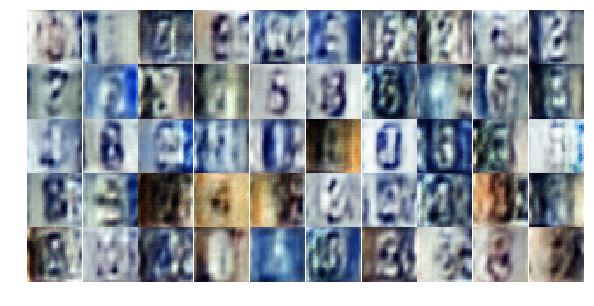

Epoch 4/10... Discriminator Loss: 1.0542... Generator Loss: 0.6033
Epoch 4/10... Discriminator Loss: 0.7740... Generator Loss: 2.5203
Epoch 4/10... Discriminator Loss: 0.7486... Generator Loss: 1.3524
Epoch 4/10... Discriminator Loss: 0.6203... Generator Loss: 1.4267
Epoch 4/10... Discriminator Loss: 0.7733... Generator Loss: 0.9374
Epoch 4/10... Discriminator Loss: 1.1106... Generator Loss: 0.6711
Epoch 4/10... Discriminator Loss: 1.2015... Generator Loss: 2.3356
Epoch 4/10... Discriminator Loss: 0.8311... Generator Loss: 0.8113
Epoch 4/10... Discriminator Loss: 0.8197... Generator Loss: 1.1087
Epoch 4/10... Discriminator Loss: 0.4888... Generator Loss: 2.7777


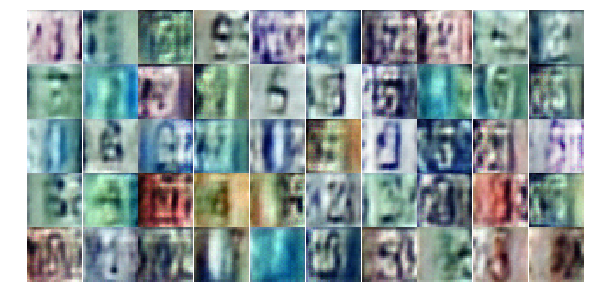

Epoch 4/10... Discriminator Loss: 0.9405... Generator Loss: 0.7278
Epoch 4/10... Discriminator Loss: 0.6369... Generator Loss: 1.4979
Epoch 4/10... Discriminator Loss: 0.9145... Generator Loss: 0.6891
Epoch 4/10... Discriminator Loss: 0.8985... Generator Loss: 1.0738
Epoch 4/10... Discriminator Loss: 0.5787... Generator Loss: 1.4276
Epoch 4/10... Discriminator Loss: 0.4609... Generator Loss: 2.5441
Epoch 4/10... Discriminator Loss: 0.4003... Generator Loss: 1.7659
Epoch 4/10... Discriminator Loss: 1.1860... Generator Loss: 0.5240
Epoch 4/10... Discriminator Loss: 0.4941... Generator Loss: 1.5786
Epoch 4/10... Discriminator Loss: 0.4588... Generator Loss: 1.7261


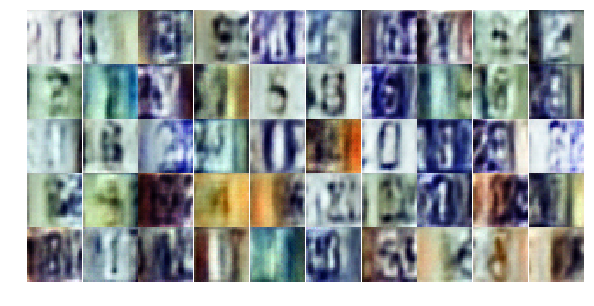

Epoch 4/10... Discriminator Loss: 0.4361... Generator Loss: 1.6101
Epoch 4/10... Discriminator Loss: 0.4022... Generator Loss: 1.8711
Epoch 4/10... Discriminator Loss: 1.0032... Generator Loss: 0.7324
Epoch 4/10... Discriminator Loss: 0.8136... Generator Loss: 2.4173
Epoch 4/10... Discriminator Loss: 0.5504... Generator Loss: 1.5657
Epoch 4/10... Discriminator Loss: 0.4882... Generator Loss: 1.9133
Epoch 4/10... Discriminator Loss: 0.8057... Generator Loss: 2.5976
Epoch 4/10... Discriminator Loss: 0.6416... Generator Loss: 1.2897
Epoch 4/10... Discriminator Loss: 0.5181... Generator Loss: 1.4549
Epoch 4/10... Discriminator Loss: 0.8634... Generator Loss: 0.7559


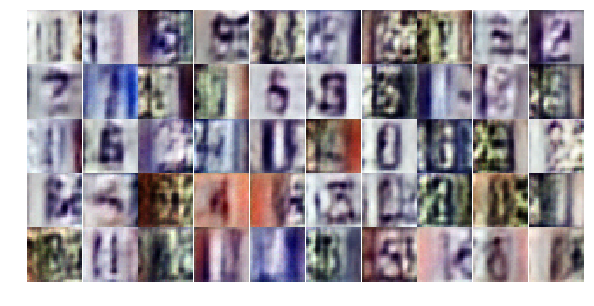

Epoch 4/10... Discriminator Loss: 0.7766... Generator Loss: 0.9144
Epoch 4/10... Discriminator Loss: 0.4227... Generator Loss: 1.5476
Epoch 4/10... Discriminator Loss: 0.5121... Generator Loss: 1.4482
Epoch 4/10... Discriminator Loss: 0.4425... Generator Loss: 1.6916
Epoch 4/10... Discriminator Loss: 0.3624... Generator Loss: 2.0552
Epoch 4/10... Discriminator Loss: 0.9605... Generator Loss: 0.8302
Epoch 4/10... Discriminator Loss: 0.5141... Generator Loss: 1.4570
Epoch 4/10... Discriminator Loss: 0.7505... Generator Loss: 1.1181
Epoch 4/10... Discriminator Loss: 0.7154... Generator Loss: 1.0059
Epoch 4/10... Discriminator Loss: 0.9437... Generator Loss: 1.4468


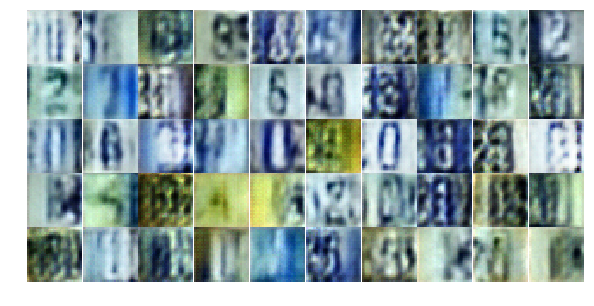

Epoch 4/10... Discriminator Loss: 0.9030... Generator Loss: 1.0519
Epoch 4/10... Discriminator Loss: 0.7493... Generator Loss: 0.9891
Epoch 4/10... Discriminator Loss: 0.4516... Generator Loss: 1.8525
Epoch 4/10... Discriminator Loss: 0.7263... Generator Loss: 1.3090
Epoch 4/10... Discriminator Loss: 0.6958... Generator Loss: 1.1702
Epoch 4/10... Discriminator Loss: 0.5776... Generator Loss: 1.4315
Epoch 4/10... Discriminator Loss: 0.4012... Generator Loss: 2.0560
Epoch 4/10... Discriminator Loss: 0.6562... Generator Loss: 1.6174
Epoch 4/10... Discriminator Loss: 0.5024... Generator Loss: 1.4095
Epoch 5/10... Discriminator Loss: 0.6398... Generator Loss: 0.9720


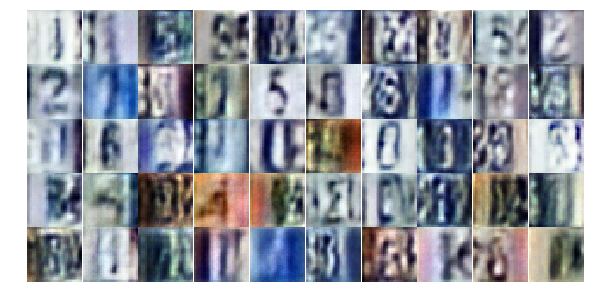

Epoch 5/10... Discriminator Loss: 0.4830... Generator Loss: 2.0434
Epoch 5/10... Discriminator Loss: 0.5281... Generator Loss: 1.3750
Epoch 5/10... Discriminator Loss: 0.5438... Generator Loss: 1.4042
Epoch 5/10... Discriminator Loss: 0.4272... Generator Loss: 1.5808
Epoch 5/10... Discriminator Loss: 0.3845... Generator Loss: 2.1294
Epoch 5/10... Discriminator Loss: 0.9799... Generator Loss: 0.6362
Epoch 5/10... Discriminator Loss: 1.5426... Generator Loss: 0.3920
Epoch 5/10... Discriminator Loss: 0.8655... Generator Loss: 2.8675
Epoch 5/10... Discriminator Loss: 0.7461... Generator Loss: 0.9977
Epoch 5/10... Discriminator Loss: 0.6670... Generator Loss: 1.2233


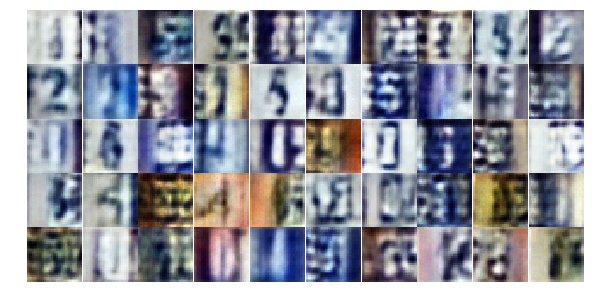

Epoch 5/10... Discriminator Loss: 0.8878... Generator Loss: 1.0748
Epoch 5/10... Discriminator Loss: 0.4774... Generator Loss: 1.4573
Epoch 5/10... Discriminator Loss: 0.3261... Generator Loss: 1.9338
Epoch 5/10... Discriminator Loss: 0.7515... Generator Loss: 0.9564
Epoch 5/10... Discriminator Loss: 0.9394... Generator Loss: 2.8758
Epoch 5/10... Discriminator Loss: 0.5107... Generator Loss: 1.7204
Epoch 5/10... Discriminator Loss: 0.3539... Generator Loss: 1.9901
Epoch 5/10... Discriminator Loss: 0.5053... Generator Loss: 1.5280
Epoch 5/10... Discriminator Loss: 0.3649... Generator Loss: 2.0069
Epoch 5/10... Discriminator Loss: 0.5593... Generator Loss: 1.2376


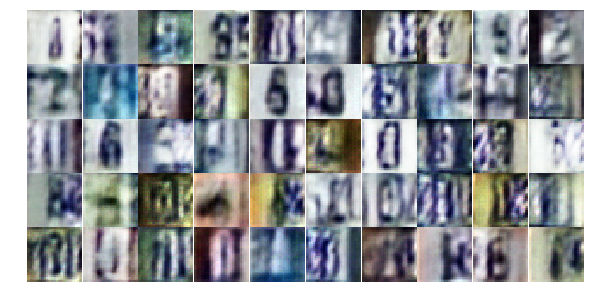

Epoch 5/10... Discriminator Loss: 0.5747... Generator Loss: 1.2149
Epoch 5/10... Discriminator Loss: 0.5920... Generator Loss: 1.6500
Epoch 5/10... Discriminator Loss: 1.5094... Generator Loss: 4.5126
Epoch 5/10... Discriminator Loss: 0.7387... Generator Loss: 1.2561
Epoch 5/10... Discriminator Loss: 0.6361... Generator Loss: 1.0585
Epoch 5/10... Discriminator Loss: 0.5355... Generator Loss: 1.2084
Epoch 5/10... Discriminator Loss: 0.8236... Generator Loss: 0.8795
Epoch 5/10... Discriminator Loss: 2.0682... Generator Loss: 0.2116
Epoch 5/10... Discriminator Loss: 0.7239... Generator Loss: 1.0099
Epoch 5/10... Discriminator Loss: 0.6537... Generator Loss: 2.1474


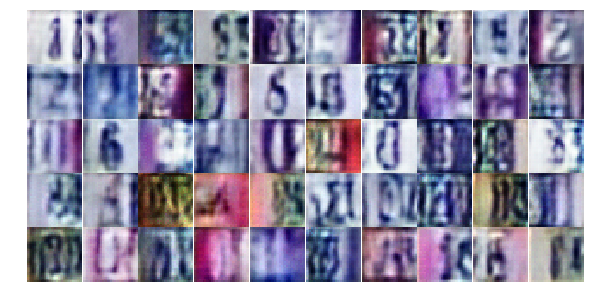

Epoch 5/10... Discriminator Loss: 0.6752... Generator Loss: 1.5010
Epoch 5/10... Discriminator Loss: 0.4967... Generator Loss: 1.8925
Epoch 5/10... Discriminator Loss: 0.8482... Generator Loss: 0.7740
Epoch 5/10... Discriminator Loss: 0.4809... Generator Loss: 1.4905
Epoch 5/10... Discriminator Loss: 0.6229... Generator Loss: 1.2536
Epoch 5/10... Discriminator Loss: 0.4910... Generator Loss: 1.8128
Epoch 5/10... Discriminator Loss: 0.7648... Generator Loss: 1.2739
Epoch 5/10... Discriminator Loss: 0.9108... Generator Loss: 0.7833
Epoch 5/10... Discriminator Loss: 0.9250... Generator Loss: 0.7169
Epoch 5/10... Discriminator Loss: 0.4409... Generator Loss: 1.7513


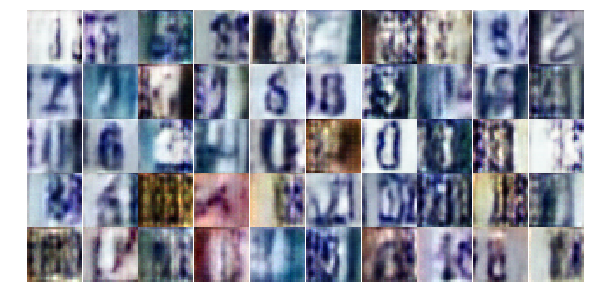

Epoch 5/10... Discriminator Loss: 0.5476... Generator Loss: 1.4066
Epoch 5/10... Discriminator Loss: 0.7586... Generator Loss: 0.8365
Epoch 5/10... Discriminator Loss: 1.0583... Generator Loss: 0.6221
Epoch 5/10... Discriminator Loss: 0.4091... Generator Loss: 1.7088
Epoch 5/10... Discriminator Loss: 0.6388... Generator Loss: 1.1199
Epoch 5/10... Discriminator Loss: 1.0730... Generator Loss: 2.4729
Epoch 5/10... Discriminator Loss: 0.5251... Generator Loss: 1.4148
Epoch 5/10... Discriminator Loss: 0.6869... Generator Loss: 2.0002
Epoch 5/10... Discriminator Loss: 0.7140... Generator Loss: 0.9163
Epoch 5/10... Discriminator Loss: 0.4577... Generator Loss: 1.8478


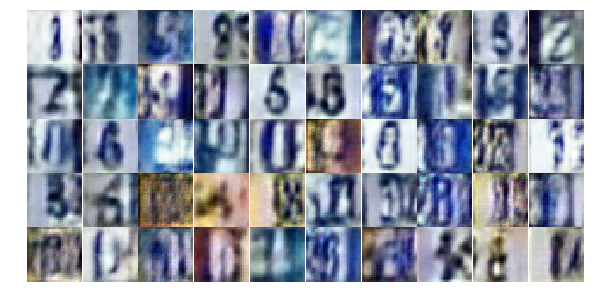

Epoch 5/10... Discriminator Loss: 0.9322... Generator Loss: 0.6668
Epoch 5/10... Discriminator Loss: 0.6354... Generator Loss: 1.1357
Epoch 5/10... Discriminator Loss: 1.0100... Generator Loss: 2.2571
Epoch 5/10... Discriminator Loss: 1.3051... Generator Loss: 0.4175
Epoch 5/10... Discriminator Loss: 0.6363... Generator Loss: 1.2237
Epoch 5/10... Discriminator Loss: 1.2518... Generator Loss: 0.4535
Epoch 6/10... Discriminator Loss: 1.3086... Generator Loss: 0.4542
Epoch 6/10... Discriminator Loss: 0.4427... Generator Loss: 1.7728
Epoch 6/10... Discriminator Loss: 0.6503... Generator Loss: 1.0890
Epoch 6/10... Discriminator Loss: 0.7241... Generator Loss: 0.9550


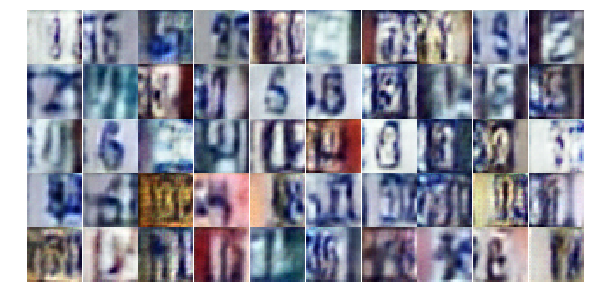

Epoch 6/10... Discriminator Loss: 0.7761... Generator Loss: 0.8951
Epoch 6/10... Discriminator Loss: 1.2065... Generator Loss: 0.5927
Epoch 6/10... Discriminator Loss: 0.5496... Generator Loss: 1.2449
Epoch 6/10... Discriminator Loss: 0.9057... Generator Loss: 0.8623
Epoch 6/10... Discriminator Loss: 1.1572... Generator Loss: 0.4906
Epoch 6/10... Discriminator Loss: 0.8933... Generator Loss: 0.7843
Epoch 6/10... Discriminator Loss: 0.4618... Generator Loss: 2.2086
Epoch 6/10... Discriminator Loss: 0.7521... Generator Loss: 0.8645
Epoch 6/10... Discriminator Loss: 0.6679... Generator Loss: 1.1074
Epoch 6/10... Discriminator Loss: 0.9128... Generator Loss: 0.8339


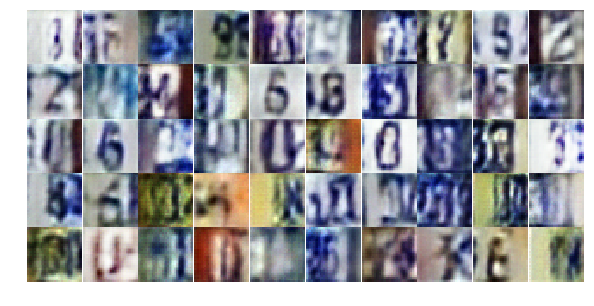

Epoch 6/10... Discriminator Loss: 0.7092... Generator Loss: 1.7920
Epoch 6/10... Discriminator Loss: 1.6990... Generator Loss: 0.5690
Epoch 6/10... Discriminator Loss: 0.6649... Generator Loss: 0.9561
Epoch 6/10... Discriminator Loss: 0.4611... Generator Loss: 1.5069
Epoch 6/10... Discriminator Loss: 0.6508... Generator Loss: 1.1704
Epoch 6/10... Discriminator Loss: 0.5042... Generator Loss: 1.3738
Epoch 6/10... Discriminator Loss: 0.8915... Generator Loss: 0.8687
Epoch 6/10... Discriminator Loss: 0.6463... Generator Loss: 1.0744
Epoch 6/10... Discriminator Loss: 0.5896... Generator Loss: 1.5150
Epoch 6/10... Discriminator Loss: 0.6804... Generator Loss: 1.7884


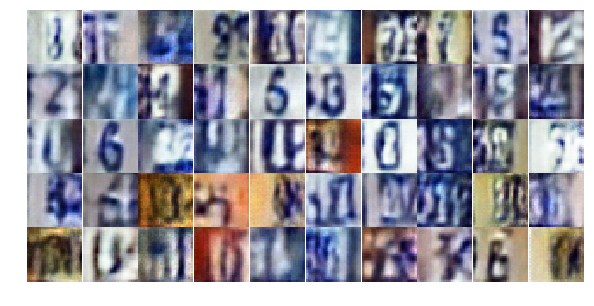

Epoch 6/10... Discriminator Loss: 0.9152... Generator Loss: 0.6829
Epoch 6/10... Discriminator Loss: 1.0166... Generator Loss: 0.5973
Epoch 6/10... Discriminator Loss: 0.8417... Generator Loss: 1.0185
Epoch 6/10... Discriminator Loss: 0.7552... Generator Loss: 1.7083
Epoch 6/10... Discriminator Loss: 0.5351... Generator Loss: 1.3787
Epoch 6/10... Discriminator Loss: 0.8297... Generator Loss: 0.9536
Epoch 6/10... Discriminator Loss: 0.5099... Generator Loss: 1.4987
Epoch 6/10... Discriminator Loss: 0.3983... Generator Loss: 1.4464
Epoch 6/10... Discriminator Loss: 0.3943... Generator Loss: 1.5969
Epoch 6/10... Discriminator Loss: 0.4847... Generator Loss: 1.5885


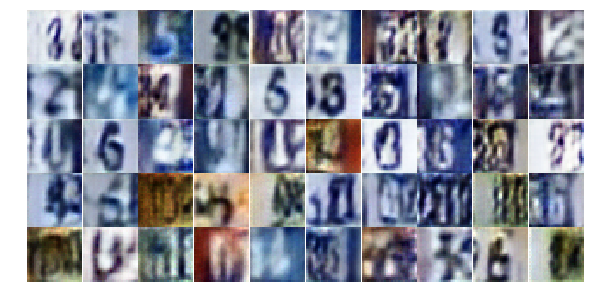

Epoch 6/10... Discriminator Loss: 1.6223... Generator Loss: 0.3367
Epoch 6/10... Discriminator Loss: 2.1282... Generator Loss: 4.2331
Epoch 6/10... Discriminator Loss: 0.6975... Generator Loss: 1.0820
Epoch 6/10... Discriminator Loss: 0.7303... Generator Loss: 0.9367
Epoch 6/10... Discriminator Loss: 0.7187... Generator Loss: 0.9768
Epoch 6/10... Discriminator Loss: 0.8391... Generator Loss: 0.8604
Epoch 6/10... Discriminator Loss: 0.6002... Generator Loss: 1.5266
Epoch 6/10... Discriminator Loss: 0.6134... Generator Loss: 1.8959
Epoch 6/10... Discriminator Loss: 1.1793... Generator Loss: 0.5254
Epoch 6/10... Discriminator Loss: 0.5848... Generator Loss: 1.2158


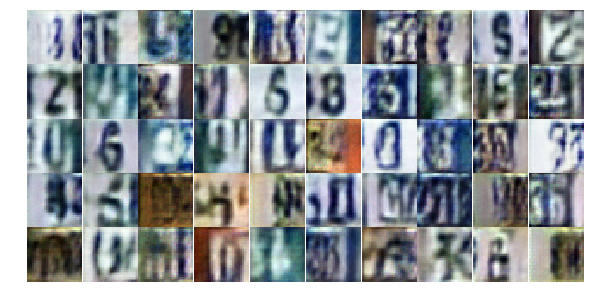

Epoch 6/10... Discriminator Loss: 1.0052... Generator Loss: 0.8464
Epoch 6/10... Discriminator Loss: 2.1478... Generator Loss: 2.9306
Epoch 6/10... Discriminator Loss: 1.4939... Generator Loss: 0.3785
Epoch 6/10... Discriminator Loss: 0.5800... Generator Loss: 1.6006
Epoch 6/10... Discriminator Loss: 0.7352... Generator Loss: 1.1659
Epoch 6/10... Discriminator Loss: 0.7628... Generator Loss: 0.9653
Epoch 6/10... Discriminator Loss: 0.6914... Generator Loss: 1.0923
Epoch 6/10... Discriminator Loss: 0.8925... Generator Loss: 0.7661
Epoch 6/10... Discriminator Loss: 0.6732... Generator Loss: 1.1441
Epoch 6/10... Discriminator Loss: 1.6910... Generator Loss: 0.2591


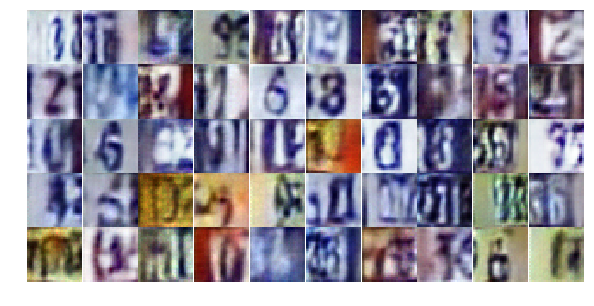

Epoch 6/10... Discriminator Loss: 0.5542... Generator Loss: 1.4434
Epoch 6/10... Discriminator Loss: 0.8100... Generator Loss: 0.7910
Epoch 6/10... Discriminator Loss: 2.0255... Generator Loss: 0.2082
Epoch 7/10... Discriminator Loss: 0.8417... Generator Loss: 1.7281
Epoch 7/10... Discriminator Loss: 0.8570... Generator Loss: 0.9092
Epoch 7/10... Discriminator Loss: 0.8222... Generator Loss: 0.8372
Epoch 7/10... Discriminator Loss: 0.6066... Generator Loss: 1.1405
Epoch 7/10... Discriminator Loss: 0.4649... Generator Loss: 1.8046
Epoch 7/10... Discriminator Loss: 0.5977... Generator Loss: 1.3485
Epoch 7/10... Discriminator Loss: 0.7260... Generator Loss: 2.2490


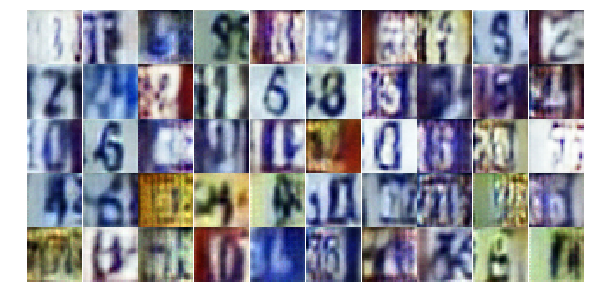

Epoch 7/10... Discriminator Loss: 0.6121... Generator Loss: 2.0462
Epoch 7/10... Discriminator Loss: 0.7647... Generator Loss: 0.9234
Epoch 7/10... Discriminator Loss: 0.7733... Generator Loss: 1.0997
Epoch 7/10... Discriminator Loss: 0.6316... Generator Loss: 1.4465
Epoch 7/10... Discriminator Loss: 0.6868... Generator Loss: 1.0121
Epoch 7/10... Discriminator Loss: 0.5258... Generator Loss: 1.2829
Epoch 7/10... Discriminator Loss: 1.0543... Generator Loss: 2.3661
Epoch 7/10... Discriminator Loss: 0.8539... Generator Loss: 1.6777
Epoch 7/10... Discriminator Loss: 0.5618... Generator Loss: 2.0920
Epoch 7/10... Discriminator Loss: 0.5771... Generator Loss: 1.3634


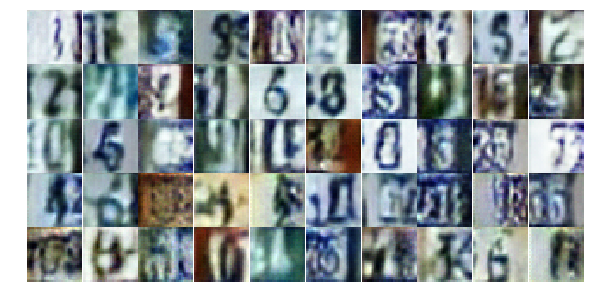

Epoch 7/10... Discriminator Loss: 0.6855... Generator Loss: 1.6605
Epoch 7/10... Discriminator Loss: 0.5033... Generator Loss: 1.6680
Epoch 7/10... Discriminator Loss: 0.6458... Generator Loss: 1.1350
Epoch 7/10... Discriminator Loss: 0.4730... Generator Loss: 1.7140
Epoch 7/10... Discriminator Loss: 0.7374... Generator Loss: 1.3079
Epoch 7/10... Discriminator Loss: 0.7378... Generator Loss: 2.5265
Epoch 7/10... Discriminator Loss: 0.8213... Generator Loss: 1.4375
Epoch 7/10... Discriminator Loss: 0.9081... Generator Loss: 0.7057
Epoch 7/10... Discriminator Loss: 0.3940... Generator Loss: 1.8677
Epoch 7/10... Discriminator Loss: 0.5662... Generator Loss: 1.7060


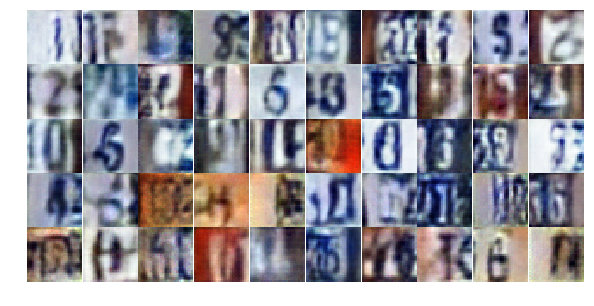

Epoch 7/10... Discriminator Loss: 0.9181... Generator Loss: 0.7312
Epoch 7/10... Discriminator Loss: 0.8803... Generator Loss: 1.3889
Epoch 7/10... Discriminator Loss: 0.5968... Generator Loss: 1.1785
Epoch 7/10... Discriminator Loss: 0.7156... Generator Loss: 0.9228
Epoch 7/10... Discriminator Loss: 0.7858... Generator Loss: 0.9216
Epoch 7/10... Discriminator Loss: 1.0528... Generator Loss: 0.6134
Epoch 7/10... Discriminator Loss: 0.6496... Generator Loss: 1.0181
Epoch 7/10... Discriminator Loss: 0.6803... Generator Loss: 1.0565
Epoch 7/10... Discriminator Loss: 1.1582... Generator Loss: 0.7361
Epoch 7/10... Discriminator Loss: 0.5166... Generator Loss: 2.6863


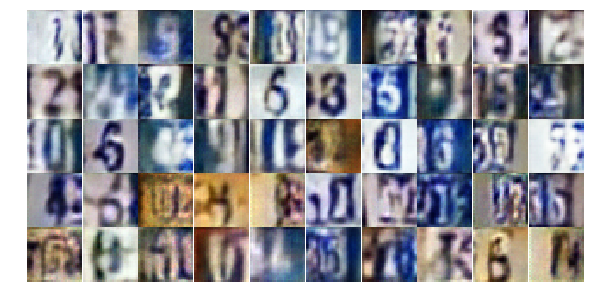

Epoch 7/10... Discriminator Loss: 0.8182... Generator Loss: 1.7630
Epoch 7/10... Discriminator Loss: 1.2386... Generator Loss: 1.9631
Epoch 7/10... Discriminator Loss: 0.9894... Generator Loss: 2.2513
Epoch 7/10... Discriminator Loss: 0.8191... Generator Loss: 2.3641
Epoch 7/10... Discriminator Loss: 0.8219... Generator Loss: 0.9940
Epoch 7/10... Discriminator Loss: 0.4850... Generator Loss: 1.5651
Epoch 7/10... Discriminator Loss: 0.4729... Generator Loss: 1.3630
Epoch 7/10... Discriminator Loss: 0.8193... Generator Loss: 1.4461
Epoch 7/10... Discriminator Loss: 0.2508... Generator Loss: 2.7917
Epoch 7/10... Discriminator Loss: 0.9394... Generator Loss: 0.7287


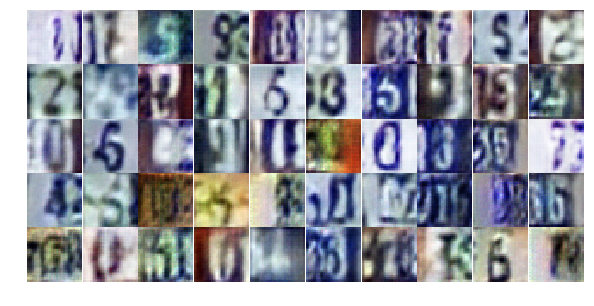

Epoch 7/10... Discriminator Loss: 0.3664... Generator Loss: 1.9811
Epoch 7/10... Discriminator Loss: 0.9976... Generator Loss: 0.6446
Epoch 7/10... Discriminator Loss: 0.6732... Generator Loss: 2.3697
Epoch 7/10... Discriminator Loss: 0.4957... Generator Loss: 1.6101
Epoch 7/10... Discriminator Loss: 0.5227... Generator Loss: 1.9147
Epoch 7/10... Discriminator Loss: 1.0637... Generator Loss: 0.6078
Epoch 7/10... Discriminator Loss: 1.5321... Generator Loss: 0.4017
Epoch 7/10... Discriminator Loss: 0.5675... Generator Loss: 1.2921
Epoch 7/10... Discriminator Loss: 0.8612... Generator Loss: 0.9593
Epoch 7/10... Discriminator Loss: 0.7729... Generator Loss: 0.8568


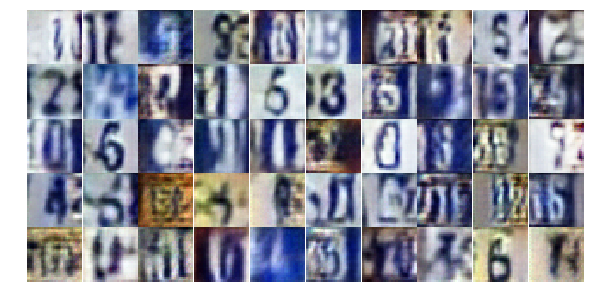

Epoch 7/10... Discriminator Loss: 0.4777... Generator Loss: 1.7331
Epoch 8/10... Discriminator Loss: 0.6151... Generator Loss: 1.1522
Epoch 8/10... Discriminator Loss: 0.8872... Generator Loss: 0.7156
Epoch 8/10... Discriminator Loss: 1.0277... Generator Loss: 0.6027
Epoch 8/10... Discriminator Loss: 0.6705... Generator Loss: 1.1910
Epoch 8/10... Discriminator Loss: 0.8587... Generator Loss: 1.1427
Epoch 8/10... Discriminator Loss: 0.5520... Generator Loss: 1.6582
Epoch 8/10... Discriminator Loss: 0.4902... Generator Loss: 1.7695
Epoch 8/10... Discriminator Loss: 1.1502... Generator Loss: 0.5692
Epoch 8/10... Discriminator Loss: 0.7949... Generator Loss: 0.8317


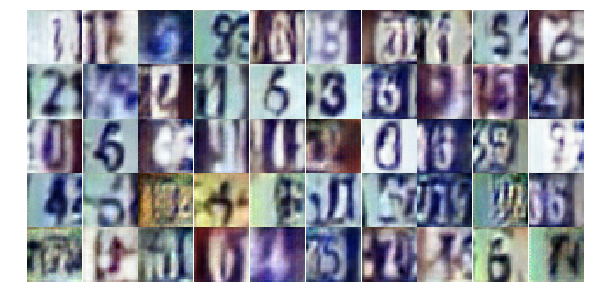

Epoch 8/10... Discriminator Loss: 0.4690... Generator Loss: 1.4682
Epoch 8/10... Discriminator Loss: 0.6152... Generator Loss: 1.4693
Epoch 8/10... Discriminator Loss: 0.8122... Generator Loss: 1.3145
Epoch 8/10... Discriminator Loss: 0.4578... Generator Loss: 1.5045
Epoch 8/10... Discriminator Loss: 1.2643... Generator Loss: 0.4398
Epoch 8/10... Discriminator Loss: 0.7856... Generator Loss: 1.9843
Epoch 8/10... Discriminator Loss: 0.5968... Generator Loss: 1.4111
Epoch 8/10... Discriminator Loss: 0.8241... Generator Loss: 0.9317
Epoch 8/10... Discriminator Loss: 0.5890... Generator Loss: 1.1408
Epoch 8/10... Discriminator Loss: 1.3443... Generator Loss: 0.3978


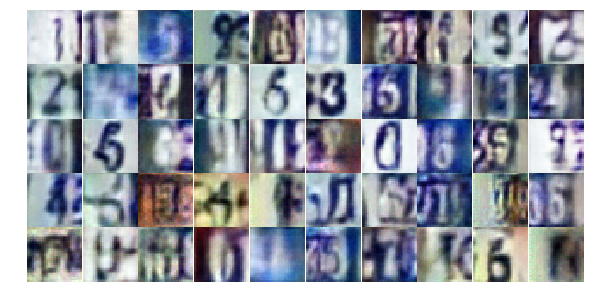

Epoch 8/10... Discriminator Loss: 0.4456... Generator Loss: 1.8647
Epoch 8/10... Discriminator Loss: 0.6181... Generator Loss: 1.1212
Epoch 8/10... Discriminator Loss: 0.5418... Generator Loss: 1.4142
Epoch 8/10... Discriminator Loss: 0.7708... Generator Loss: 1.0157
Epoch 8/10... Discriminator Loss: 0.5485... Generator Loss: 1.4489
Epoch 8/10... Discriminator Loss: 0.6203... Generator Loss: 1.3028
Epoch 8/10... Discriminator Loss: 0.6835... Generator Loss: 1.1115
Epoch 8/10... Discriminator Loss: 0.3949... Generator Loss: 2.2598
Epoch 8/10... Discriminator Loss: 0.6692... Generator Loss: 1.7462
Epoch 8/10... Discriminator Loss: 0.7653... Generator Loss: 0.9922


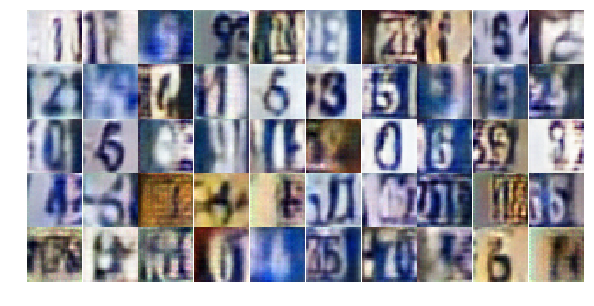

Epoch 8/10... Discriminator Loss: 0.8026... Generator Loss: 1.4083
Epoch 8/10... Discriminator Loss: 0.7904... Generator Loss: 0.9030
Epoch 8/10... Discriminator Loss: 0.8006... Generator Loss: 0.9985
Epoch 8/10... Discriminator Loss: 1.1621... Generator Loss: 0.4735
Epoch 8/10... Discriminator Loss: 0.6056... Generator Loss: 1.2046
Epoch 8/10... Discriminator Loss: 0.4850... Generator Loss: 1.2865
Epoch 8/10... Discriminator Loss: 0.9599... Generator Loss: 0.7206
Epoch 8/10... Discriminator Loss: 0.7521... Generator Loss: 0.9672
Epoch 8/10... Discriminator Loss: 0.6998... Generator Loss: 1.0206
Epoch 8/10... Discriminator Loss: 0.4097... Generator Loss: 1.7751


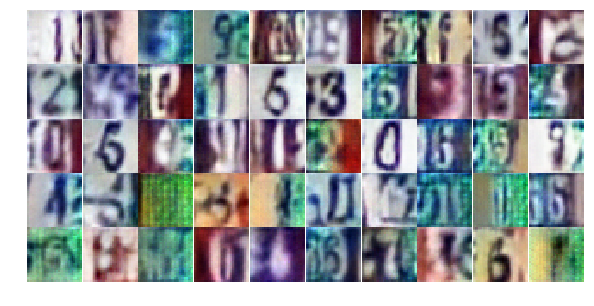

Epoch 8/10... Discriminator Loss: 0.7067... Generator Loss: 2.8373
Epoch 8/10... Discriminator Loss: 0.9724... Generator Loss: 0.7319
Epoch 8/10... Discriminator Loss: 0.4185... Generator Loss: 1.6610
Epoch 8/10... Discriminator Loss: 0.6492... Generator Loss: 1.1544
Epoch 8/10... Discriminator Loss: 0.8354... Generator Loss: 1.9146
Epoch 8/10... Discriminator Loss: 0.6767... Generator Loss: 1.1511
Epoch 8/10... Discriminator Loss: 0.4808... Generator Loss: 1.2415
Epoch 8/10... Discriminator Loss: 0.3709... Generator Loss: 1.7914
Epoch 8/10... Discriminator Loss: 1.8215... Generator Loss: 4.9179
Epoch 8/10... Discriminator Loss: 0.8891... Generator Loss: 1.3261


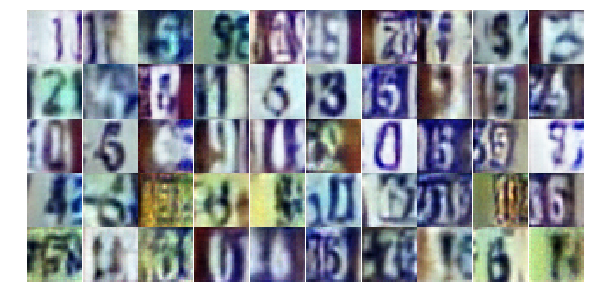

Epoch 8/10... Discriminator Loss: 0.5313... Generator Loss: 1.9365
Epoch 8/10... Discriminator Loss: 0.8515... Generator Loss: 0.8349
Epoch 8/10... Discriminator Loss: 0.5671... Generator Loss: 1.5459
Epoch 8/10... Discriminator Loss: 1.0862... Generator Loss: 0.5682
Epoch 8/10... Discriminator Loss: 0.5457... Generator Loss: 2.3806
Epoch 8/10... Discriminator Loss: 0.9807... Generator Loss: 0.6867
Epoch 8/10... Discriminator Loss: 0.6279... Generator Loss: 1.2299
Epoch 8/10... Discriminator Loss: 0.5670... Generator Loss: 1.7447
Epoch 9/10... Discriminator Loss: 1.7394... Generator Loss: 0.2660
Epoch 9/10... Discriminator Loss: 0.8221... Generator Loss: 0.8292


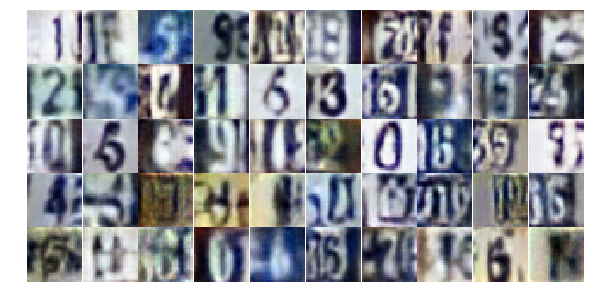

Epoch 9/10... Discriminator Loss: 0.6609... Generator Loss: 1.1427
Epoch 9/10... Discriminator Loss: 0.8760... Generator Loss: 0.8919
Epoch 9/10... Discriminator Loss: 1.2250... Generator Loss: 0.5005
Epoch 9/10... Discriminator Loss: 0.5730... Generator Loss: 1.3185
Epoch 9/10... Discriminator Loss: 0.8569... Generator Loss: 0.8203
Epoch 9/10... Discriminator Loss: 0.7466... Generator Loss: 2.7583
Epoch 9/10... Discriminator Loss: 0.5873... Generator Loss: 1.4224
Epoch 9/10... Discriminator Loss: 0.5293... Generator Loss: 1.2299
Epoch 9/10... Discriminator Loss: 0.7703... Generator Loss: 0.9060
Epoch 9/10... Discriminator Loss: 0.7905... Generator Loss: 1.1366


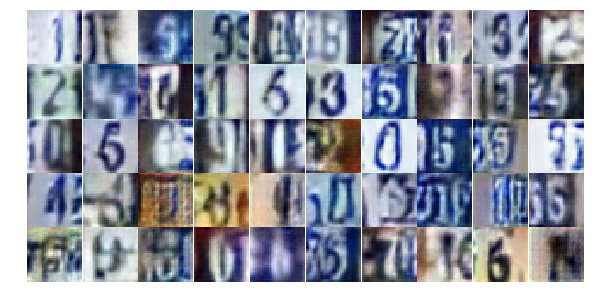

Epoch 9/10... Discriminator Loss: 1.3362... Generator Loss: 2.7048
Epoch 9/10... Discriminator Loss: 1.2281... Generator Loss: 0.5948
Epoch 9/10... Discriminator Loss: 0.8012... Generator Loss: 1.7850
Epoch 9/10... Discriminator Loss: 0.9301... Generator Loss: 0.6875
Epoch 9/10... Discriminator Loss: 0.6062... Generator Loss: 1.1474
Epoch 9/10... Discriminator Loss: 0.8536... Generator Loss: 0.9785
Epoch 9/10... Discriminator Loss: 0.8327... Generator Loss: 0.8467
Epoch 9/10... Discriminator Loss: 0.4794... Generator Loss: 1.5265
Epoch 9/10... Discriminator Loss: 1.3029... Generator Loss: 0.4169
Epoch 9/10... Discriminator Loss: 0.9030... Generator Loss: 0.7320


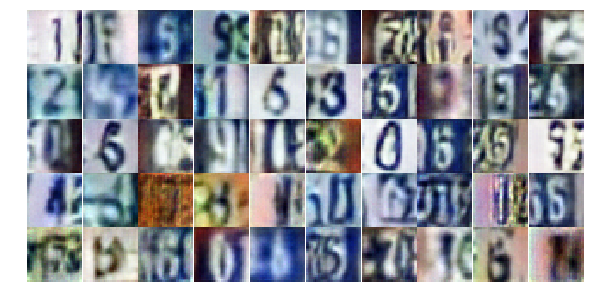

Epoch 9/10... Discriminator Loss: 0.9465... Generator Loss: 0.6995
Epoch 9/10... Discriminator Loss: 0.5834... Generator Loss: 1.4622
Epoch 9/10... Discriminator Loss: 0.6292... Generator Loss: 1.3533
Epoch 9/10... Discriminator Loss: 0.6521... Generator Loss: 1.3729
Epoch 9/10... Discriminator Loss: 0.5960... Generator Loss: 1.6323
Epoch 9/10... Discriminator Loss: 0.6326... Generator Loss: 1.4875
Epoch 9/10... Discriminator Loss: 1.0478... Generator Loss: 0.6745
Epoch 9/10... Discriminator Loss: 0.5728... Generator Loss: 1.4428
Epoch 9/10... Discriminator Loss: 0.6133... Generator Loss: 1.0701
Epoch 9/10... Discriminator Loss: 0.7306... Generator Loss: 0.9576


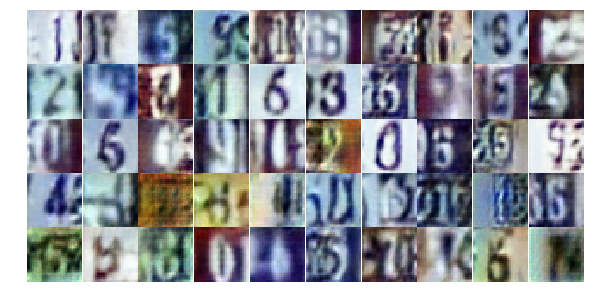

Epoch 9/10... Discriminator Loss: 0.7340... Generator Loss: 0.8348
Epoch 9/10... Discriminator Loss: 0.8518... Generator Loss: 0.7699
Epoch 9/10... Discriminator Loss: 0.6878... Generator Loss: 1.0995
Epoch 9/10... Discriminator Loss: 0.6784... Generator Loss: 1.1705
Epoch 9/10... Discriminator Loss: 0.6420... Generator Loss: 1.6349
Epoch 9/10... Discriminator Loss: 0.7882... Generator Loss: 2.1134
Epoch 9/10... Discriminator Loss: 0.5743... Generator Loss: 1.2583
Epoch 9/10... Discriminator Loss: 0.5941... Generator Loss: 1.1492
Epoch 9/10... Discriminator Loss: 0.9815... Generator Loss: 0.6861
Epoch 9/10... Discriminator Loss: 0.8021... Generator Loss: 0.8549


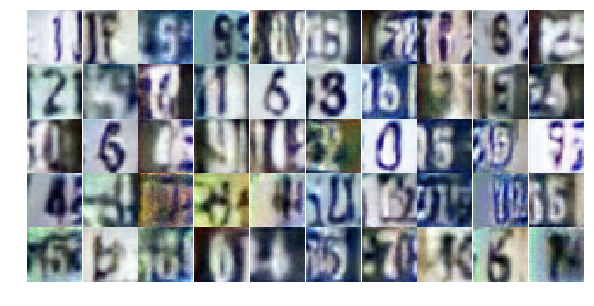

Epoch 9/10... Discriminator Loss: 0.6077... Generator Loss: 1.1891
Epoch 9/10... Discriminator Loss: 0.8497... Generator Loss: 0.7756
Epoch 9/10... Discriminator Loss: 1.5571... Generator Loss: 0.4444
Epoch 9/10... Discriminator Loss: 0.9109... Generator Loss: 0.9034
Epoch 9/10... Discriminator Loss: 0.5777... Generator Loss: 1.3172
Epoch 9/10... Discriminator Loss: 0.6419... Generator Loss: 1.3467
Epoch 9/10... Discriminator Loss: 1.0345... Generator Loss: 0.9572
Epoch 9/10... Discriminator Loss: 1.0829... Generator Loss: 0.5455
Epoch 9/10... Discriminator Loss: 0.6859... Generator Loss: 1.5570
Epoch 9/10... Discriminator Loss: 0.9046... Generator Loss: 1.9224


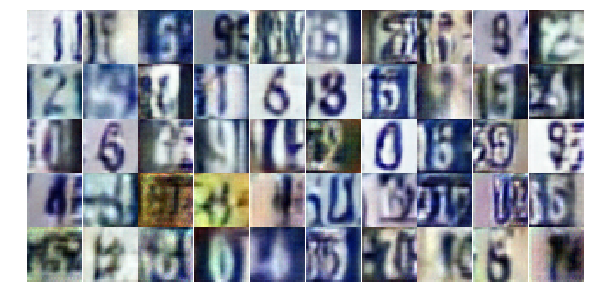

Epoch 9/10... Discriminator Loss: 1.2796... Generator Loss: 0.5030
Epoch 9/10... Discriminator Loss: 0.5610... Generator Loss: 1.7979
Epoch 9/10... Discriminator Loss: 0.7814... Generator Loss: 0.9557
Epoch 9/10... Discriminator Loss: 0.8368... Generator Loss: 0.7477
Epoch 9/10... Discriminator Loss: 0.8985... Generator Loss: 0.7701
Epoch 10/10... Discriminator Loss: 0.5394... Generator Loss: 1.4809
Epoch 10/10... Discriminator Loss: 0.5763... Generator Loss: 1.1481
Epoch 10/10... Discriminator Loss: 0.6228... Generator Loss: 1.0766
Epoch 10/10... Discriminator Loss: 0.7728... Generator Loss: 0.8754
Epoch 10/10... Discriminator Loss: 1.3930... Generator Loss: 0.3502


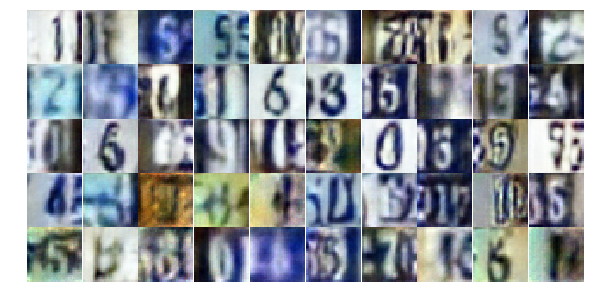

Epoch 10/10... Discriminator Loss: 1.2450... Generator Loss: 0.4665
Epoch 10/10... Discriminator Loss: 0.6575... Generator Loss: 1.0998
Epoch 10/10... Discriminator Loss: 0.6755... Generator Loss: 1.3038
Epoch 10/10... Discriminator Loss: 0.6129... Generator Loss: 1.3212
Epoch 10/10... Discriminator Loss: 0.5843... Generator Loss: 1.6155
Epoch 10/10... Discriminator Loss: 0.8693... Generator Loss: 1.0265
Epoch 10/10... Discriminator Loss: 0.5270... Generator Loss: 1.2739
Epoch 10/10... Discriminator Loss: 1.1434... Generator Loss: 0.5156
Epoch 10/10... Discriminator Loss: 1.7597... Generator Loss: 0.2979
Epoch 10/10... Discriminator Loss: 0.6590... Generator Loss: 1.2296


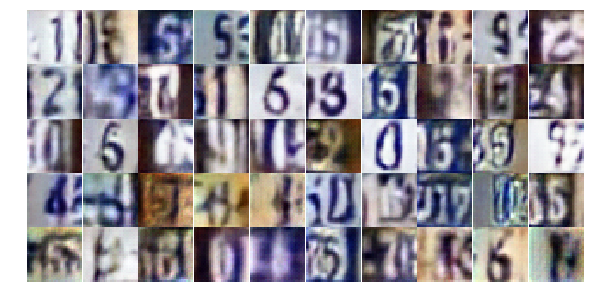

Epoch 10/10... Discriminator Loss: 0.7120... Generator Loss: 1.2176
Epoch 10/10... Discriminator Loss: 0.7249... Generator Loss: 1.1557
Epoch 10/10... Discriminator Loss: 0.5656... Generator Loss: 1.3624
Epoch 10/10... Discriminator Loss: 1.0232... Generator Loss: 0.6630
Epoch 10/10... Discriminator Loss: 0.7270... Generator Loss: 1.0430
Epoch 10/10... Discriminator Loss: 0.6238... Generator Loss: 1.1494
Epoch 10/10... Discriminator Loss: 0.7868... Generator Loss: 1.1446
Epoch 10/10... Discriminator Loss: 0.5687... Generator Loss: 1.2764
Epoch 10/10... Discriminator Loss: 0.5704... Generator Loss: 1.5716
Epoch 10/10... Discriminator Loss: 0.3326... Generator Loss: 2.1249


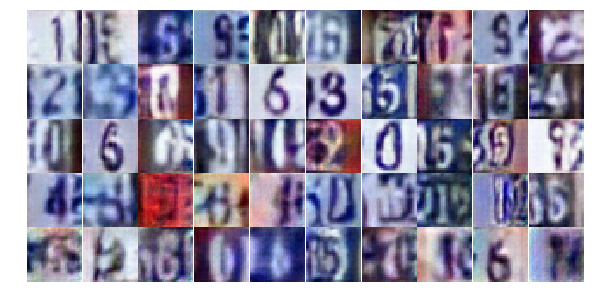

Epoch 10/10... Discriminator Loss: 1.0174... Generator Loss: 0.5935
Epoch 10/10... Discriminator Loss: 0.8306... Generator Loss: 0.7807
Epoch 10/10... Discriminator Loss: 0.4980... Generator Loss: 1.2743
Epoch 10/10... Discriminator Loss: 0.6736... Generator Loss: 2.4267
Epoch 10/10... Discriminator Loss: 1.2569... Generator Loss: 0.4480
Epoch 10/10... Discriminator Loss: 0.8372... Generator Loss: 0.7874
Epoch 10/10... Discriminator Loss: 0.3828... Generator Loss: 2.0115
Epoch 10/10... Discriminator Loss: 0.5876... Generator Loss: 1.7950
Epoch 10/10... Discriminator Loss: 0.6914... Generator Loss: 0.9971
Epoch 10/10... Discriminator Loss: 0.9349... Generator Loss: 0.7044


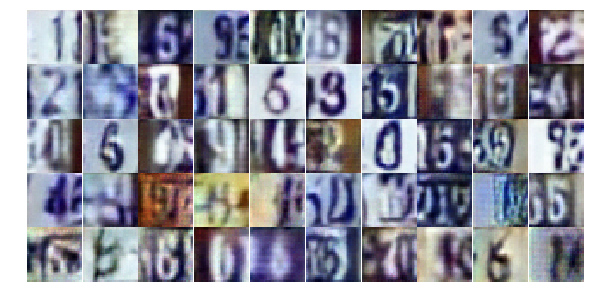

Epoch 10/10... Discriminator Loss: 0.6857... Generator Loss: 2.4518
Epoch 10/10... Discriminator Loss: 0.7130... Generator Loss: 0.9882
Epoch 10/10... Discriminator Loss: 0.7827... Generator Loss: 1.1102
Epoch 10/10... Discriminator Loss: 0.6449... Generator Loss: 1.6557
Epoch 10/10... Discriminator Loss: 0.9207... Generator Loss: 0.6933
Epoch 10/10... Discriminator Loss: 0.9873... Generator Loss: 0.6982
Epoch 10/10... Discriminator Loss: 0.7403... Generator Loss: 1.0131
Epoch 10/10... Discriminator Loss: 1.1642... Generator Loss: 0.5693
Epoch 10/10... Discriminator Loss: 0.7286... Generator Loss: 0.9028
Epoch 10/10... Discriminator Loss: 0.7924... Generator Loss: 3.2328


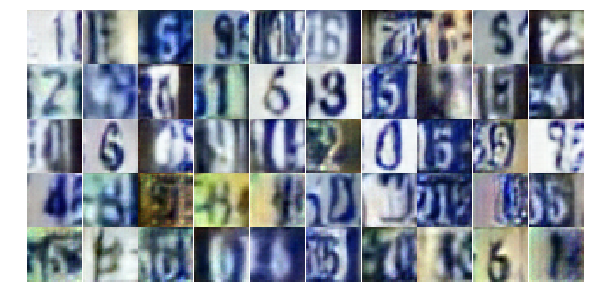

Epoch 10/10... Discriminator Loss: 0.6275... Generator Loss: 1.0548
Epoch 10/10... Discriminator Loss: 0.7612... Generator Loss: 1.0586
Epoch 10/10... Discriminator Loss: 0.8030... Generator Loss: 0.7575
Epoch 10/10... Discriminator Loss: 0.8341... Generator Loss: 1.5813
Epoch 10/10... Discriminator Loss: 0.5165... Generator Loss: 1.5254
Epoch 10/10... Discriminator Loss: 0.8463... Generator Loss: 1.0811
Epoch 10/10... Discriminator Loss: 0.6729... Generator Loss: 1.0361
Epoch 10/10... Discriminator Loss: 0.5072... Generator Loss: 1.3443
Epoch 10/10... Discriminator Loss: 1.1081... Generator Loss: 3.0606
Epoch 10/10... Discriminator Loss: 1.4936... Generator Loss: 3.3119


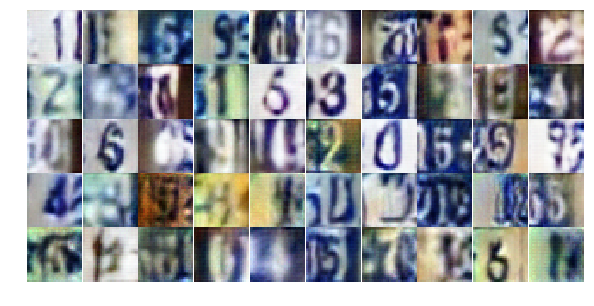

Epoch 10/10... Discriminator Loss: 0.6751... Generator Loss: 1.1985
Epoch 10/10... Discriminator Loss: 0.8570... Generator Loss: 0.8023
Epoch 10/10... Discriminator Loss: 0.6768... Generator Loss: 0.9672


In [73]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

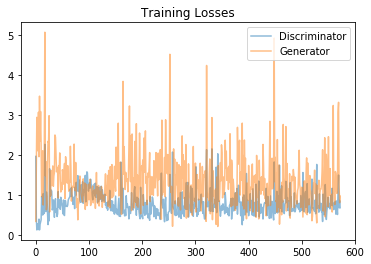

In [74]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

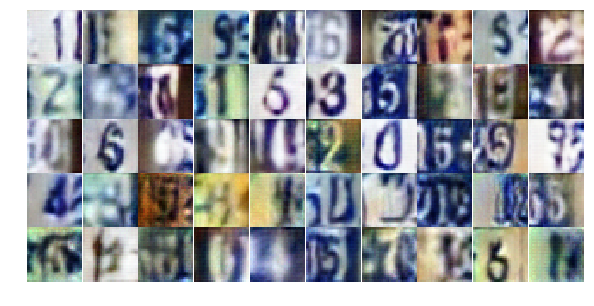

In [75]:
_ = view_samples(-1, samples, 5, 10, figsize=(10,5))